<center><h1>Image Transformation</h1></center>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

<h1>Rotation</h1>

In [2]:
def rotate_image(image,rotation_angle):
    height, width = image.shape[:2]
    cx, cy = width/2, height/2

    theta = np.radians(rotation_angle)
    cos_theta, sin_theta = np.cos(theta), np.sin(theta)

    rotation_matrix = np.array([
        [cos_theta, -sin_theta, (1 - cos_theta) * cx + sin_theta * cy],
        [sin_theta, cos_theta, (1 - cos_theta) * cy - sin_theta * cx],
        [0, 0, 1]
    ])
    rotated_image = np.zeros_like(image)
    for x in range(width):
        for y in range(height):
            coord = np.array([x, y, 1])
            new_x, new_y, _ = rotation_matrix @ coord

            new_x, new_y = int(new_x), int(new_y)

            if 0 <= new_x < width and 0 <= new_y < height:
                rotated_image[new_y,new_x] = image[y,x]

    return rotated_image

<h1>Tanslation Image</h1>

In [3]:
#Manual Method
def translation_image(image, tx, ty):
    height, width = image.shape[:2]
    translated_image = np.zeros_like(image)
    for x in range(width):
        for y in range(height):
            new_x, new_y = x+int(tx), y+int(ty)
            if 0 <= new_x <width and 0 <= new_y < height:
                translated_image[new_y, new_x] = image[y,x]

    return translated_image

<h1>Shearing Image</h1>

In [4]:
#Manual Shearing
def shearing_image(image, shear_x, shear_y):
    height, width = image.shape[:2]
    shear_matrix = np.array([
        [1, shear_x, 0],
        [shear_y, 1, 0]
    ])

    new_width = int(width + abs(shear_x * height))
    new_height = int(height + abs(shear_y * width))

    sheared_image = np.zeros((new_height, new_width, 3),dtype=np.uint8)

    for x in range(width):
        for y in range(height):
            new_x, new_y = shear_matrix @[x, y, 1]
            new_x, new_y = int(new_x), int(new_y)

            if 0 <= new_x < new_width and 0 <= new_y < new_height:
                sheared_image[new_y,new_x]=image[y,x]
    return sheared_image



<h1>Scaling Image</h1>

In [5]:
def manual_scaling(image, scale_x, scale_y):
    height, width = image.shape[:2]

    new_width = int(width * scale_x)
    new_height = int(height * scale_y)

    scaled_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)

    for x in range(new_width):
        for y in range(new_height):
            orig_x = int(x / scale_x)
            orig_y = int(y / scale_y)

            if orig_x < width and orig_y < height:
                scaled_image[y, x] = image[orig_y, orig_x]

    return scaled_image



<h1>Reflection of an Image</h1>

In [6]:
def manual_reflection(image, axis):
    height, width = image.shape[:2]
    reflected_image = np.zeros_like(image)

    if axis == 'x':  # Vertical flip
        for x in range(width):
            for y in range(height):
                reflected_image[height - y - 1, x] = image[y, x]

    elif axis == 'y':  # Horizontal flip
        for x in range(width):
            for y in range(height):
                reflected_image[y, width - x - 1] = image[y, x]

    elif axis == 'xy':  # Flip both axes (180° rotation)
        for x in range(width):
            for y in range(height):
                reflected_image[height - y - 1, width - x - 1] = image[y, x]

    return reflected_image



<h1>Affine Transformation(Rotation,Shearing,Reflection,Scaling)</h1>

In [7]:
def affine_tranform(image):
    rows, cols, ch = image.shape
    theta = np.radians(20)
    scale = 1.0
    tx, ty = 50, 30
    man_matrix = np.array([
        [scale * np.cos(theta), -scale * np.sin(theta), tx],
        [scale * np.sin(theta), scale * np.cos(theta), ty]
    ], dtype = np.float32)

    affine_img = np.zeros_like(image)
    for y in range(rows):
        for x in range(cols):
            new_coords = np.dot(man_matrix,np.array([x,y,1]))
            x_new, y_new = int(new_coords[0]), int(new_coords[1])

            if 0 <= x_new < cols and 0 <= y_new < rows:
                affine_img[y_new,x_new] = image[y, x]
    
    return affine_img

<h3>Image 1</h3>

In [ ]:
image1 = cv2.imread("lena.png") #Replace with your image path
cv2.imshow("Image",image1)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [9]:
#Rotation
rotated_image = rotate_image(image1,45)

#Translation
translated_image = translation_image(image1, 50, 30)

#Shearing
sheared_image = shearing_image(image1, 0.4, 0.4)

#Scaling
scaled_img = manual_scaling(image1, scale_x=1.5, scale_y=1.5)

#Reflection
#Flip along X-axis
reflected_x_img = manual_reflection(image1, axis='x')

#Flip along Y-axis
reflected_y_img = manual_reflection(image1, axis='y')

#Flip both axes
reflected_xy_img = manual_reflection(image1, axis='xy')

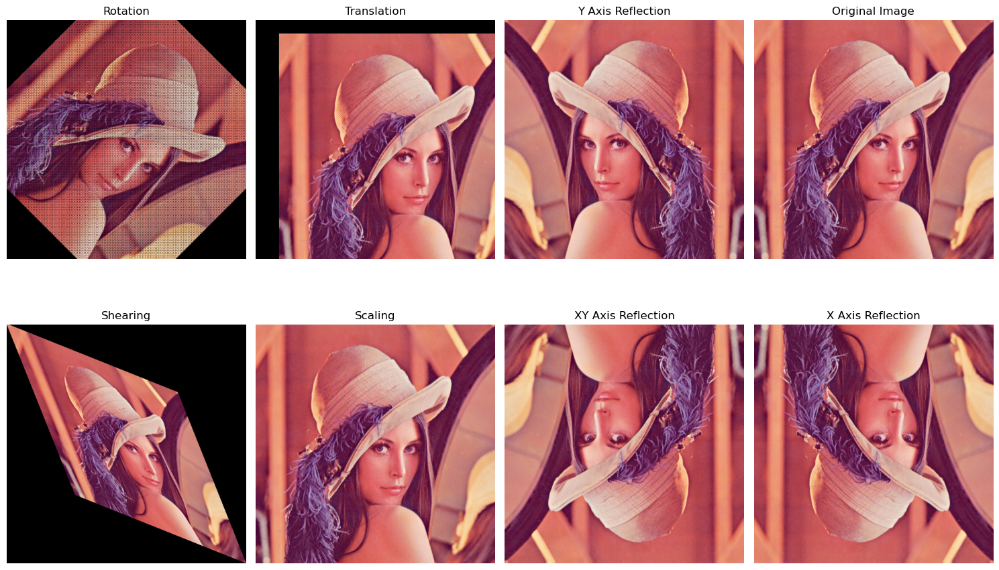

In [10]:
images = [rotated_image, translated_image,reflected_y_img, image1, sheared_image, scaled_img, reflected_xy_img, reflected_x_img]
titles =["Rotation","Translation","Y Axis Reflection","Original Image","Shearing","Scaling","XY Axis Reflection","X Axis Reflection"]

nrows = 2  
ncols = 4

plt.figure(figsize=(15, 10))

for i, img in enumerate(images):
    plt.subplot(nrows, ncols, i + 1)  
    plt.imshow(img[:,:,::-1])
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

<h3>Image 2</h3>

In [ ]:
image2 = cv2.imread("spider.jpg") #Replace with your image path
cv2.imshow("Image",image2)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [12]:
#Rotation
rotated_image = rotate_image(image2,45)

#Translation
translated_image = translation_image(image2, 50, 30)

#Shearing
sheared_image = shearing_image(image2, 0.4, 0.4)

#Scaling
scaled_img = manual_scaling(image2, scale_x=1.5, scale_y=1.5)

#Reflection
#Flip along X-axis
reflected_x_img = manual_reflection(image2, axis='x')

#Flip along Y-axis
reflected_y_img = manual_reflection(image2, axis='y')

#Flip both axes
reflected_xy_img = manual_reflection(image2, axis='xy')

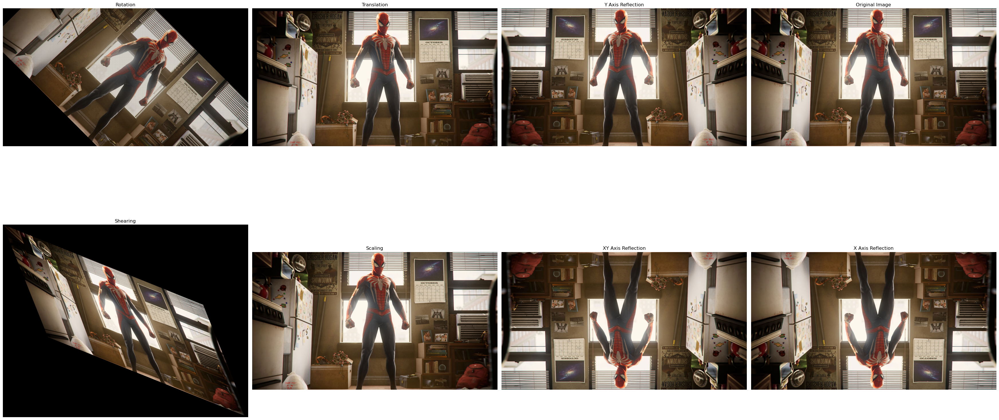

In [13]:
images = [rotated_image, translated_image, reflected_y_img, image2, sheared_image, scaled_img, reflected_xy_img, reflected_x_img]
titles =["Rotation","Translation","Y Axis Reflection","Original Image","Shearing","Scaling","XY Axis Reflection","X Axis Reflection"]

nrows = 2  
ncols = 4

plt.figure(figsize=(35, 20))

for i, img in enumerate(images):
    plt.subplot(nrows, ncols, i + 1)  
    plt.imshow(img[:,:,::-1])
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

<h1>Affine Transformation</h1>

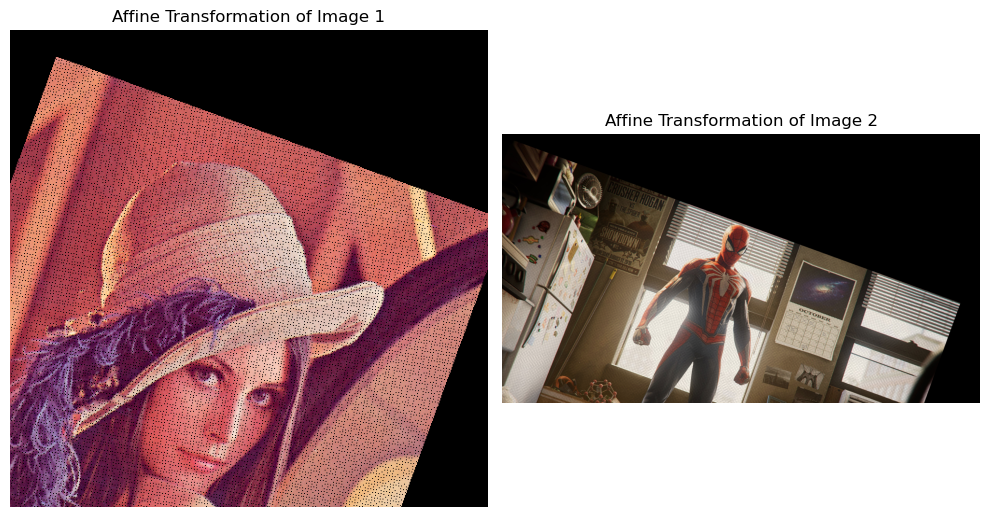

In [14]:
affine_image1 = affine_tranform(image1)

affine_image2 = affine_tranform(image2)

images = [affine_image1, affine_image2]
titles =["Affine Transformation of Image 1","Affine Transformation of Image 2"]

nrows = 1  
ncols = 2

plt.figure(figsize=(10, 10))

for i, img in enumerate(images):
    plt.subplot(nrows, ncols, i + 1)  
    plt.imshow(img[:,:,::-1])
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()